# B2B customer prospecting using the Google Maps API

- https://developers.google.com/maps/documentation/places/web-service/details
- https://python-visualization.github.io/folium/modules.html


### Questions:
- How do you define a customer?
- What kind of features are important?

## 0. Setup

In [2]:
import pandas as pd
import numpy as np
import time 
import tqdm as tq

import requests
import json
import folium
import haversine as hs
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely.ops import cascaded_union, unary_union

import matplotlib.pyplot as plt
import seaborn as sns

def get_b2b_clients_by_loc(loc, radius, type):
    # 1. Setup
    def json2df_results(results_json):
        # get json results and transform in DF
        results_df = pd.DataFrame(results_json)
        results_df["lat"] = results_df["geometry"].apply(lambda row: row["location"]["lat"])
        results_df["lng"] = results_df["geometry"].apply(lambda row: row["location"]["lng"])

        # filling missing columns
        columns = ['business_status', 'name', 'user_ratings_total', 'rating', 'vicinity', 'lat', 'lng', "types", 'place_id', 'phone_number']
        diff = list(set(columns) - set(results_df.columns))
        for missing_column in  diff:
            results_df[missing_column] = np.nan

        results_df = results_df[columns]
        return results_df
        
    

    url = "https://maps.googleapis.com/maps/api/place/{method}/json?{paramns}&key={key}"
    with open('api_key.txt') as f:
        API_KEY = f.read()
    payload={}
    headers = {}

    
    # 2. First request
    url_nearbysearch_first = url.format(method="nearbysearch", 
                                        paramns=f"location={loc[0]}%2C{loc[1]}&radius={radius}&type={type}",
                                        key=API_KEY)
    response = requests.request("GET", url_nearbysearch_first, headers=headers, data=payload).json()
    if response["status"] == "OK":
        results_df = json2df_results(response["results"])

        # 3. Iterating until there is no next page
        while "next_page_token" in response.keys():
            time.sleep(2)
            
            url_nearbysearch = url.format(method="nearbysearch", 
                                        paramns=f"pagetoken={response['next_page_token']}",
                                        key=API_KEY)
            response = requests.request("GET", url_nearbysearch, headers=headers, data=payload).json()

            if response["status"] == "OK":
                results_df_temp = json2df_results(response["results"])

                results_df = pd.concat([results_df, results_df_temp])
        
        # 4. Adding phone number
        # placeid2phone_map = {}
        # for place_id in results_df["place_id"]:
        #     placeid2phone_map[place_id] = get_phone_number(place_id)

        results_df.index = range(len(results_df))
        # results_df["phone_number"] = results_df["place_id"].map(placeid2phone_map)

        return results_df
    
    else:
        return pd.DataFrame([])

def get_phone_number(place_id):
    url = "https://maps.googleapis.com/maps/api/place/{method}/json?{paramns}&key={key}"
    with open('api_key.txt') as f:
        API_KEY = f.read()
    payload={}
    headers = {}
    # get details: phone number
    url_details = url.format(method="details", 
                            paramns=f"place_id={place_id}&fields=formatted_phone_number",
                            key=API_KEY)
    response_details = requests.request("GET", url_details, headers=headers, data=payload)
    result = response_details.json()["result"]
    if bool(result):
        phone_number = result["formatted_phone_number"]
    else: 
        phone_number = np.nan
    
    return phone_number


Bad key text.latex.preview in file c:\Users\lukan\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 123 ('text.latex.preview : False')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.6.0/matplotlibrc.template
or from the matplotlib source distribution

Bad key mathtext.fallback_to_cm in file c:\Users\lukan\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 155 ('mathtext.fallback_to_cm : True  # When True, use symbols from the Computer Modern')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.6.0/matplotlibrc.template
or from the matplotlib source distribution

Bad key savefig.jpeg_quality in file c:\Users\lukan\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 418 ('savefig.jpeg_quality: 95       # when a jpeg is saved, the default quality parameter.')
You proba

5.349922390376407


## 1. GeoJS RN cities

In [8]:
import requests

In [16]:


geojson

,type,properties,geometry
0,Feature,"{'id': '2400109', 'name': 'Acari', 'descriptio...","{'type': 'Polygon', 'coordinates': [[[-36.6752..."
1,Feature,"{'id': '2400208', 'name': 'Açu', 'description'...","{'type': 'Polygon', 'coordinates': [[[-37.0150..."
2,Feature,"{'id': '2400307', 'name': 'Afonso Bezerra', 'd...","{'type': 'Polygon', 'coordinates': [[[-36.4395..."
3,Feature,"{'id': '2400406', 'name': 'Água Nova', 'descri...","{'type': 'Polygon', 'coordinates': [[[-38.3087..."
4,Feature,"{'id': '2400505', 'name': 'Alexandria', 'descr...","{'type': 'Polygon', 'coordinates': [[[-37.9020..."
...,...,...,...
162,Feature,"{'id': '2414704', 'name': 'Várzea', 'descripti...","{'type': 'Polygon', 'coordinates': [[[-35.3385..."
163,Feature,"{'id': '2414753', 'name': 'Venha-Ver', 'descri...","{'type': 'Polygon', 'coordinates': [[[-38.4845..."
164,Feature,"{'id': '2414803', 'name': 'Vera Cruz', 'descri...","{'type': 'Polygon', 'coordinates': [[[-35.3727..."
165,Feature,"{'id': '2414902', 'name': 'Viçosa', 'descripti...","{'type': 'Polygon', 'coordinates': [[[-37.9335..."


In [17]:
geojson_dict = {"id" : geojson.apply(lambda row: row["properties"]["id"], axis=1),
                "name" : geojson.apply(lambda row: row["properties"]["name"], axis=1),
                "coord" : geojson.apply(lambda row: row["geometry"], axis=1)}
pd.DataFrame(geojson_dict)

,id,name,coord
0,2400109,Acari,"{'type': 'Polygon', 'coordinates': [[[-36.6752..."
1,2400208,Açu,"{'type': 'Polygon', 'coordinates': [[[-37.0150..."
2,2400307,Afonso Bezerra,"{'type': 'Polygon', 'coordinates': [[[-36.4395..."
3,2400406,Água Nova,"{'type': 'Polygon', 'coordinates': [[[-38.3087..."
4,2400505,Alexandria,"{'type': 'Polygon', 'coordinates': [[[-37.9020..."
...,...,...,...
162,2414704,Várzea,"{'type': 'Polygon', 'coordinates': [[[-35.3385..."
163,2414753,Venha-Ver,"{'type': 'Polygon', 'coordinates': [[[-38.4845..."
164,2414803,Vera Cruz,"{'type': 'Polygon', 'coordinates': [[[-35.3727..."
165,2414902,Viçosa,"{'type': 'Polygon', 'coordinates': [[[-37.9335..."


In [3]:
f = open("geojs-24-mun.json", encoding="utf-8")
geojson = pd.DataFrame(json.load(f)["features"])
geojson_dict = {"id" : geojson.apply(lambda row: row["properties"]["id"], axis=1),
                "name" : geojson.apply(lambda row: row["properties"]["name"], axis=1),
                "coord" : geojson.apply(lambda row: row["geometry"], axis=1)}
geojson_df = pd.DataFrame(geojson_dict)

In [4]:
geojson_df

,id,name,coord
0,2400109,Acari,"{'type': 'Polygon', 'coordinates': [[[-36.6752..."
1,2400208,Açu,"{'type': 'Polygon', 'coordinates': [[[-37.0150..."
2,2400307,Afonso Bezerra,"{'type': 'Polygon', 'coordinates': [[[-36.4395..."
3,2400406,Água Nova,"{'type': 'Polygon', 'coordinates': [[[-38.3087..."
4,2400505,Alexandria,"{'type': 'Polygon', 'coordinates': [[[-37.9020..."
...,...,...,...
162,2414704,Várzea,"{'type': 'Polygon', 'coordinates': [[[-35.3385..."
163,2414753,Venha-Ver,"{'type': 'Polygon', 'coordinates': [[[-38.4845..."
164,2414803,Vera Cruz,"{'type': 'Polygon', 'coordinates': [[[-35.3727..."
165,2414902,Viçosa,"{'type': 'Polygon', 'coordinates': [[[-37.9335..."


In [9]:
m = folium.Map(location=[-5.402580, -36.954107], zoom_start=8)
for row in geojson_df.itertuples():
    folium.GeoJson(data=row.coord).add_to(m) 
m

In [44]:
teste = ["Grande Natal", "Natal"]
grande_natal = ["Natal", "Parnamirim", "São Gonçalo do Amarante", "Macaíba", "Extremoz", "Arês", "Bom Jesus", 
                    "Ceará-Mirim", "Goianinha", "Ielmo Marinho", "Maxaranguape", "Monte Alegre", "Nísia Floresta", 
                    "São José de Mipibu", "Vera Cruz"]

if "Grande Natal" in teste:
    teste.remove("Grande Natal")
    teste = np.concatenate([teste, grande_natal])

In [45]:
teste

array(['Natal', 'Natal', 'Parnamirim', 'São Gonçalo do Amarante',
       'Macaíba', 'Extremoz', 'Arês', 'Bom Jesus', 'Ceará-Mirim',
       'Goianinha', 'Ielmo Marinho', 'Maxaranguape', 'Monte Alegre',
       'Nísia Floresta', 'São José de Mipibu', 'Vera Cruz'], dtype='<U23')

In [46]:
geojson_df.query(f"name == 'Acari'")

,id,name,coord
0,2400109,Acari,"{'type': 'Polygon', 'coordinates': [[[-36.6752..."


In [84]:
minx, miny, maxx, maxy

(-35.2957945441, -5.9843096794, -35.1215309359, -5.703314506)

In [96]:
delta_x, delta_y

(0.17426360820000042, 0.2809951734)

In [90]:
c = 1.5
dist_dg = 0.01 * c

delta_x = maxx-minx
delta_y = maxy-miny
num_x = int(np.ceil(delta_x/(dist_dg*2)))
num_y = int(np.ceil(delta_y/(dist_dg*2)))

num_x, num_y

(6, 10)

## 2. Segmenting Grande Natal into searching regions:

In [78]:
grande_natal = ["Natal", "Parnamirim", "São Gonçalo do Amarante", "Macaíba", "Extremoz", "Arês", "Bom Jesus", 
                "Ceará-Mirim", "Goianinha", "Ielmo Marinho", "Maxaranguape", "Monte Alegre", "Nísia Floresta", 
                "São José de Mipibu", "Vera Cruz"]
grande_natal_poligonos = [Polygon(geojson_df.query(f"name == '{name}'")["coord"].values[0]["coordinates"][0]) for name in grande_natal]
parnamrim_natal_poligonos = grande_natal_poligonos[:2]

grande_natal_poligono = unary_union(grande_natal_poligonos)
parnamrim_natal_poligono = unary_union(parnamrim_natal_poligonos)

In [102]:
polygon = parnamrim_natal_poligono #Polygon(geojson_df.query("name == 'Natal'")["coord"].values[0]["coordinates"][0])
minx, miny, maxx, maxy = polygon.bounds
latitude, longitude = miny, minx
c = 1.5
dist_dg = 0.01 * c

delta_x = maxx-minx
delta_y = maxy-miny
num_x = int(np.ceil(delta_x/(dist_dg)))
num_y = int(np.ceil(delta_y/(dist_dg)))

coord_list = []
coord_list_natal = []
for i in range(num_y):
    for j in range(num_x):
        coord = [latitude+(i*dist_dg)+(j%2*dist_dg/2), longitude+(j*dist_dg)]
        coord_list.append(coord)

        point = Point(coord[1], coord[0])
        if polygon.contains(point):
            coord_list_natal.append(coord)

dist_km = hs.haversine(coord_list[0],coord_list[1])*1000

In [103]:
print("Number of Regions:", len(coord_list_natal), "\nEstimated cost:", len(coord_list_natal)*3*0.032, "$")

Number of Regions: 103 
Estimated cost: 9.888 $


In [104]:
m = folium.Map(location=coord_list_natal[0], zoom_start=11)
for coord in coord_list_natal:
    folium.Circle(coord, dist_km/2, fill=True).add_to(m)

# poligonos_requests = [Point(coord[1], coord[0]).buffer(0.0056*c) for coord in coord_list_natal]
# style = {'fillColor': '#228B22', 'color': '#228B22'}
# for pol in poligonos_requests:
#     folium.GeoJson(data=pol,style_function=lambda x:style).add_to(m)

folium.GeoJson(data=parnamrim_natal_poligono).add_to(m) 
m

In [6]:

from forex_python.converter import CurrencyRates
import datetime
c = CurrencyRates()
dt = datetime.datetime.now()
c.get_rate('USD', 'BRL', dt)

SSLError: HTTPSConnectionPool(host='theforexapi.com', port=443): Max retries exceeded with url: /api/2022-12-21?base=USD&symbols=BRL&rtype=fpy (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1131)')))

## 3. establishments per region

In [ ]:
# supermarket, bakery, restaurant, bar, cafe, convenience_store, liquor_store, meal_delivery, meal_takeaway, 

In [71]:
b2b_prospection= pd.DataFrame([])
radius = dist_km/2
results_per_loc = []
for loc in tq.tqdm(coord_list_natal):
    b2b_prospection_temp = get_b2b_clients_by_loc(loc, radius, "restaurant")
    results_per_loc.append(len(b2b_prospection_temp))
    b2b_prospection = pd.concat([b2b_prospection, b2b_prospection_temp])

100%|██████████| 103/103 [05:37<00:00,  3.27s/it]


In [72]:
b2b_prospection = b2b_prospection.query("business_status == 'OPERATIONAL'")
b2b_prospection = b2b_prospection.drop_duplicates("place_id")
print(b2b_prospection.shape)
b2b_prospection.head()

(2506, 10)


,business_status,name,user_ratings_total,rating,vicinity,lat,lng,types,place_id,phone_number
0,OPERATIONAL,Restaurante Pirangi,33.0,3.9,"Rua Pedro Moura, 337-405 - Pirangi do Norte, P...",-5.979162,-35.122971,"[restaurant, food, point_of_interest, establis...",ChIJCZ5niM3wsgcR2d3H0-f3hTo,NaN
1,OPERATIONAL,VeeganFit,70.0,4.9,Rua Manoel Estevão do Nascimento - Pirangi do ...,-5.975577,-35.129736,"[restaurant, food, point_of_interest, establis...",ChIJWRucYvT3sgcRz6No2YTtyl8,NaN
2,OPERATIONAL,Nativus,NaN,NaN,"Rua Maria Cristina Xavier, 170 - Pirangi do No...",-5.974708,-35.130573,"[bar, restaurant, food, point_of_interest, est...",ChIJrX_WvN_3sgcRvPpUnf0-QqQ,NaN
3,OPERATIONAL,Casa de Taipa,8.0,4.1,"Avenida São Sebastião, 54 - Pirangi do Norte, ...",-5.973385,-35.132013,"[bar, meal_takeaway, restaurant, food, point_o...",ChIJL-sQIjT3sgcRu6LsGRtcQoA,NaN
4,OPERATIONAL,Curió Praia,39.0,4.4,"Avenida Deputado Márcio Marinho, 1232-1400 - P...",-5.973636,-35.128115,"[restaurant, food, point_of_interest, establis...",ChIJUc5wwTT3sgcRDefKpMat824,NaN


Text(0.5, 1.0, 'restaurant')

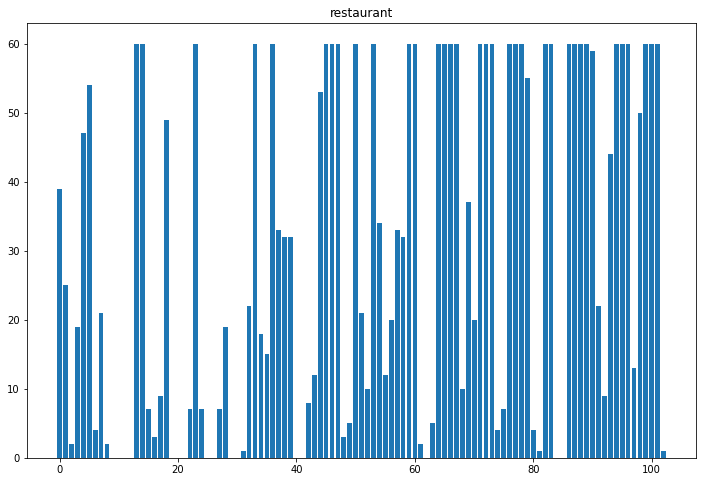

In [73]:
plt.figure(figsize=[12,8])
plt.bar(range(len(results_per_loc)), results_per_loc)
plt.title("restaurant")

In [74]:
b2b_restaurant_prospection = b2b_prospection.copy()
b2b_restaurant_prospection["phone_number"] = b2b_restaurant_prospection.apply(lambda x: get_phone_number(x["place_id"]), axis=1)
b2b_restaurant_prospection.sort_values("phone_number").to_excel("b2b_restaurant_natalparnamirim.xlsx", index=False)

# 4. Concating results

In [86]:
b2b_supermarket_prospection = pd.read_excel("b2b_supermarket_grandenatal.xlsx")
b2b_bakery_prospection = pd.read_excel("b2b_bakery_natalparnamirim.xlsx")
b2b_restaurant_prospection = pd.read_excel("b2b_restaurant_natalparnamirim.xlsx")

In [102]:
b2b_supermarket_prospection["tipo"], b2b_bakery_prospection["tipo"], b2b_restaurant_prospection["tipo"] = "mercado", "padaria", "restaurante"
b2b_prospection_all = pd.concat([b2b_supermarket_prospection, b2b_bakery_prospection, b2b_restaurant_prospection])
b2b_prospection_all = b2b_prospection_all.drop_duplicates("place_id").dropna(subset=["phone_number"])

columns = ['tipo', 'name', 'vicinity', 'phone_number', 'user_ratings_total', 'rating', "lat", "lng"]
new_columns = ['Tipo', 'Nome', 'Endereço', 'Telefone', 'Número de avaliações', 'Avaliação', 'Latitude', 'Longitude']

b2b_prospection_all = b2b_prospection_all[columns]
b2b_prospection_all.columns = new_columns

b2b_prospection_all.head()

,Tipo,Nome,Endereço,Telefone,Número de avaliações,Avaliação,Latitude,Longitude
0,mercado,Centronorte Armazéns Gerais,"Rua Presidente Tancredo Neves 13, Mascarenhas",(27) 3731-1008,1.0,2.0,-5.935780,-35.288604
1,mercado,Mercadinho Paraíba,"São Tarém, Rua Iguatú, 520 - Potengi, Natal",(41) 98851-6972,8.0,4.8,-5.752550,-35.240679
2,mercado,Mercadinho Santarém,"Rua Iguatú, 06 A - Potengi, Natal",(41) 99495-6819,13.0,4.3,-5.752377,-35.240164
3,mercado,Mercado Boa Esperanca,"2080, Rua dos Cardeais - Pitimbú, Natal",(47) 3443-1365,5.0,4.8,-5.870350,-35.231318
4,mercado,Cirne irmãos Ltda,"Rua Carteiro Macedo, 17A - Dix-Sept Rosado, Natal",(81) 99890-7283,3.0,3.7,-5.809212,-35.230196


In [106]:
with pd.ExcelWriter('prospeccao_b2b.xlsx') as writer:  # doctest: +SKIP
    b2b_prospection_all.query("Tipo == 'mercado'").to_excel(writer, sheet_name='Mercado', index=False, engine='xlsxwriter')
    b2b_prospection_all.query("Tipo == 'padaria'").to_excel(writer, sheet_name='Padaria', index=False, engine='xlsxwriter')
    b2b_prospection_all.query("Tipo == 'restaurante'").to_excel(writer, sheet_name='Restaurante', index=False, engine='xlsxwriter')


In [ ]:
b2b_prospection_all

In [103]:
b2b_prospection_all.to_excel("b2b_prospecion_all.xlsx", index=False)

<AxesSubplot: xlabel='tipo', ylabel='count'>

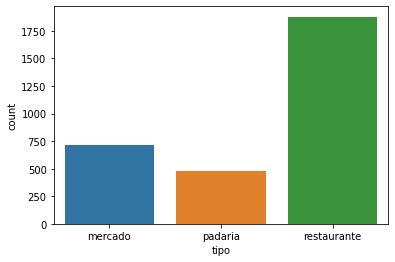

In [84]:
sns.countplot(x=b2b_prospection_all["tipo"])

In [92]:
m = folium.Map(location=coord_list_natal[0], zoom_start=11)
for client in b2b_supermarket_prospection.dropna(subset=["phone_number"]).itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    folium.Circle([latitude, longitude], 0.1, color="red", fill=True).add_to(m)
for client in b2b_bakery_prospection.dropna(subset=["phone_number"]).itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    folium.Circle([latitude, longitude], 0.1, color="green", fill=True).add_to(m)
for client in b2b_restaurant_prospection.dropna(subset=["phone_number"]).itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    folium.Circle([latitude, longitude], 0.1, color="blue", fill=True).add_to(m)

red = {'fillColor': '#FC7979', 'color': '#FF0000'}
green = {'fillColor': '#79FC7B', 'color': '#17A700'}
blue = {'fillColor': '#7983FC', 'color': '#0013FF'}
folium.GeoJson(data=grande_natal_poligono,style_function=lambda x:red).add_to(m)
folium.GeoJson(data=parnamrim_natal_poligono,style_function=lambda x:green).add_to(m)
folium.GeoJson(data=parnamrim_natal_poligono,style_function=lambda x:blue).add_to(m)
m

<BarContainer object of 1338 artists>

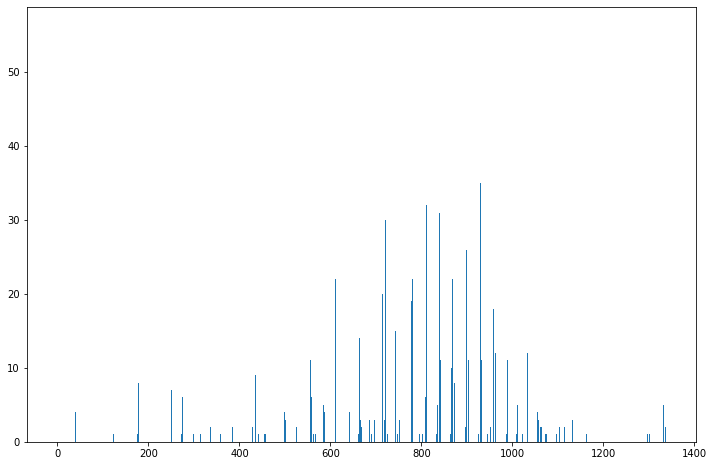

In [247]:
plt.figure(figsize=[12,8])
plt.bar(range(len(results_per_loc)), results_per_loc)

In [18]:
b2b_prospection["phone_number"].isna().value_counts().to_frame()

,phone_number
False,420
True,339


In [259]:
m = folium.Map(location=coord_list_natal[0], zoom_start=11)
for client in b2b_prospection.itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    
    folium.Circle([latitude, longitude], 0.1, color="red", fill=True).add_to(m)
folium.GeoJson(data=grande_natal_poligono,style_function=lambda x:style).add_to(m)
m

In [248]:
m = folium.Map(location=coord_list_natal[0], zoom_start=11)
for client in b2b_prospection.itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    
    if pd.isnull(client.phone_number):
        color = "red"
    else:
        color = "green"

    folium.Marker(
        location=[latitude, longitude], 
        popup=nome,
        icon=folium.Icon(color=color)
    ).add_to(m)
folium.GeoJson(data=geojson_df.query("name == 'Natal'")["coord"].values[0]).add_to(m) 
for pol in poligonos_requests:
    folium.GeoJson(data=pol,style_function=lambda x:style).add_to(m)  
m

In [ ]:
poligonos_requests

In [3]:
b2b_supermarket_prospection = pd.read_excel("b2b_supermarket_grandenatal.xlsx")

In [9]:
b2b_supermarket_prospection["phone_number"] = b2b_supermarket_prospection.apply(lambda x: get_phone_number(x["place_id"]), axis=1)

In [14]:
b2b_supermarket_prospection.sort_values("phone_number").to_excel("b2b_supermarket_grandenatal.xlsx", index=False)

In [36]:
grande_natal = ["Natal", "Parnamirim", "São Gonçalo do Amarante", "Macaíba", "Extremoz", "Arês", "Bom Jesus", 
                "Ceará-Mirim", "Goianinha", "Ielmo Marinho", "Maxaranguape", "Monte Alegre", "Nísia Floresta", 
                "São José de Mipibu", "Vera Cruz"]
grande_natal_poligonos = [Polygon(geojson_df.query(f"name == '{name}'")["coord"].values[0]["coordinates"][0]) for name in grande_natal]

In [30]:
m = folium.Map(location=coord_list_natal[0], zoom_start=11)
for client in b2b_supermarket_prospection.itertuples():
    latitude, longitude, nome = client.lat, client.lng, client.name
    
    folium.Circle([latitude, longitude], 0.1, color="red", fill=True).add_to(m)
for poligono in grande_natal_poligonos:
    folium.GeoJson(data=poligono).add_to(m)
style = {'fillColor': '#228B22', 'color': '#228B22'}
for poligono in grande_natal_poligonos[:2]:
    folium.GeoJson(data=poligono,style_function=lambda x:style).add_to(m)
m

In [47]:
results_per_city = {}
for i, poligono in enumerate(grande_natal_poligonos):
    count = 0
    for row in b2b_supermarket_prospection.itertuples():
        latitude, longitude = row.lat, row.lng
        point = Point(longitude, latitude)
        if poligono.contains(point):
            count += 1
    
    results_per_city[grande_natal[i]] = count
    

In [48]:
results_per_city

{'Natal': 771,
 'Parnamirim': 198,
 'São Gonçalo do Amarante': 118,
 'Macaíba': 73,
 'Extremoz': 62,
 'Arês': 12,
 'Bom Jesus': 9,
 'Ceará-Mirim': 68,
 'Goianinha': 18,
 'Ielmo Marinho': 3,
 'Maxaranguape': 11,
 'Monte Alegre': 17,
 'Nísia Floresta': 35,
 'São José de Mipibu': 50,
 'Vera Cruz': 14}

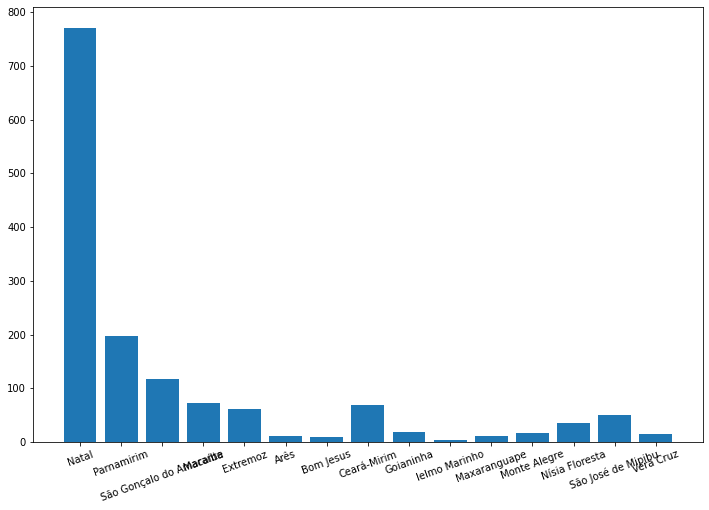

In [55]:
plt.figure(figsize=[12,8])
plt.bar(results_per_city.keys(), results_per_city.values())
plt.xticks(rotation = 20)
plt.show()

> Exporting Report:

In [260]:
b2b_prospection.to_excel("b2b_prospection_grandenatal.xlsx", index=False)
# m.save(outfile= "b2b_prospection.html")   

In [264]:
pd.DataFrame(results_per_loc, columns=["results"]).to_csv("results_per_request.csv", index=False)

In [150]:
b2b_prospection = pd.read_excel("b2b_prospection.xlsx")
b2b_prospection.shape

(759, 9)

In [146]:
regiao_dict = {}
for i, regiao in enumerate(poligonos_requests):
    count = 0
    for row in b2b_prospection.itertuples():
        point = Point(row.lng, row.lat)
        if regiao.contains(point):
            count += 1
    regiao_dict[i] = count

In [147]:
regiao_dict.values()

dict_values([0, 0, 4, 12, 3, 4, 7, 11, 3, 3, 16, 14, 4, 1, 6, 0, 1, 7, 37, 3, 4, 0, 0, 0, 28, 18, 17, 11, 13, 0, 0, 13, 42, 20, 6, 1, 0, 17, 7, 6, 2, 0, 0, 11, 40, 18, 22, 2, 0, 10, 51, 31, 40, 24, 16, 15, 32, 35, 17, 2])

In [148]:
sum(regiao_dict.values())

707

In [51]:
import matplotlib.pyplot as plt

<BarContainer object of 133 artists>

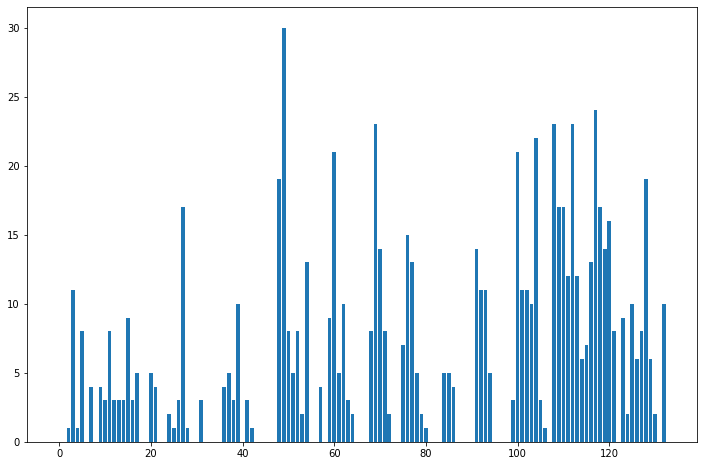

In [126]:
plt.figure(figsize=[12,8])
plt.bar(range(len(poligonos_requests)), regiao_dict.values())

<BarContainer object of 31 artists>

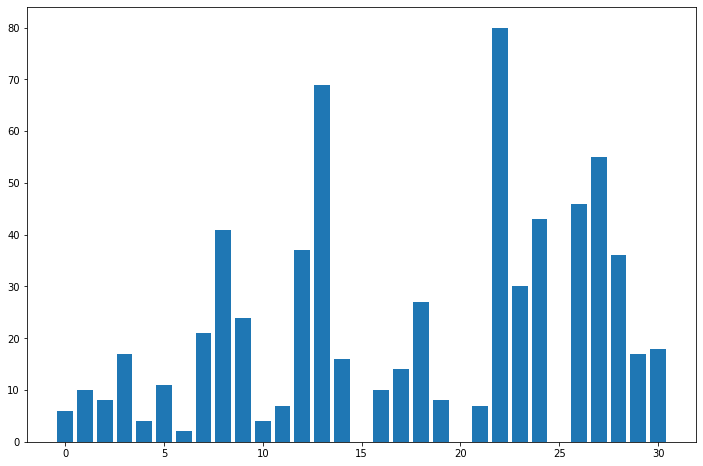

In [134]:
plt.figure(figsize=[12,8])
plt.bar(range(len(poligonos_requests)), regiao_dict.values())

<BarContainer object of 60 artists>

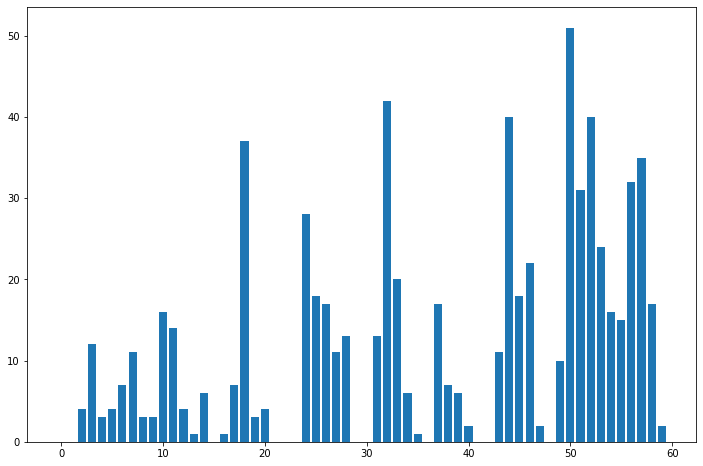

In [149]:
plt.figure(figsize=[12,8])
plt.bar(range(len(poligonos_requests)), regiao_dict.values())

In [ ]:
# bakery, bar, cafe, convenience_store, liquor_store, meal_delivery, meal_takeaway, restaurant, supermarket

## Merge Polygons

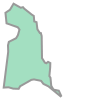

In [21]:
natal = Polygon(geojson_df.query("name == 'Natal'")["coord"].values[0]["coordinates"][0])
parnamirim = Polygon(geojson_df.query("name == 'Parnamirim'")["coord"].values[0]["coordinates"][0])

from shapely.ops import cascaded_union, unary_union
unary_union([natal, parnamirim])

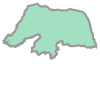

In [45]:
geojson_df["name"] = geojson_df["name"].str.replace("'","")
poligonos = [Polygon(geojson_df.query(f"name == '{name}'")["coord"].values[0]["coordinates"][0]) for name in geojson_df.name]

from shapely.ops import cascaded_union, unary_union
rn_poligono = unary_union(poligonos)

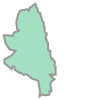

In [167]:
grande_natal = ["Natal", "Parnamirim", "São Gonçalo do Amarante", "Macaíba", "Extremoz", "Arês", "Bom Jesus", 
                "Ceará-Mirim", "Goianinha", "Ielmo Marinho", "Maxaranguape", "Monte Alegre", "Nísia Floresta", 
                "São José de Mipibu", "Vera Cruz"]
grande_natal_poligonos = [Polygon(geojson_df.query(f"name == '{name}'")["coord"].values[0]["coordinates"][0]) for name in grande_natal]
grande_natal_poligono = unary_union(grande_natal_poligonos)
grande_natal_poligono